In [ ]:
# pip install diffusers

### Ellipse Bubbles

In [ ]:
# %%writefile overlay_text_ellips_bubbls.py

### Circle Bubbles

In [ ]:
# %%writefile overlay_text_circ_bubbles.py

In [ ]:
COMIC_DATA = {
    "Fanta": [
        {
            "prompt": "Captain Ace and Anya, a time-traveling detective in a trench coat, stands in a futuristic lab. He gazes at a shimmering temporal anomaly. Dr. Anya Sharma, a physicist in a lab coat, points nervously at a console. Western comic art style, dramatic lighting, lab equipment.",
            "narrative": "The temporal anomaly pulsed, a tear in the fabric of time.",
            "dialogue": {"Ace": "Another ripple, Anya? What's Chronos up to now?", "Anya": "It's worse, Ace. He's targeting the past... again!"}
        },
        {
            "prompt": "Ace and Anya, now in a sleek time-ship, chase a dark cloaked figure (Chronos) through a time vortex. Debris from different eras floats past. Dynamic action, speed, and motion. Western comic book style.",
            "narrative": "A desperate pursuit through fractured timelines.",
            "dialogue": {"Ace": "Hold tight, doc! This ain't gonna be smooth!", "Anya": "Just get us there before he alters history!"}
        },
        {
            "prompt": "Ace, holding a futuristic energy pistol, confronts Chronos in an ancient Egyptian temple. Anya is behind him, trying to activate a device. Chronos raises a hand, crackling with dark energy. Epic scale, energy effects.",
            "narrative": "A clash of eras, a battle for history.",
            "dialogue": {"Chronos": "Foolish mortals! You cannot stop destiny!", "Ace": "Destiny? Or just a bad case of ego?"}
        },
        {
            "prompt": "Close-up of Dr. Anya Sharma, determined, typing on her wrist-mounted device. Chronos is distracted by Ace. Focused expression, subtle glow from the device. Western comic book art style.",
            "narrative": "Anya worked on a desperate gambit while Ace engaged.",
            "dialogue": {"Anya (thinking)": "Just a few more seconds..."}
        },
        {
            "prompt": "A wave of temporal energy erupts from Anya’s device, engulfing Chronos. His form distorts and fades. Ace watches, ready. Explosive energy, dramatic effect. Western comic book art style.",
            "narrative": "Time recoiled, erasing the rogue.",
            "dialogue": {"Ace": "Looks like your time's up, pal!"}
        },
        {
            "prompt": "Ace and Anya stand in their futuristic lab, the temporal anomaly now stable. Ace sips coffee, Anya sighs in relief. Calm resolution, subtle humor. Western comic art style.",
            "narrative": "The timeline restored, for now. Another day, another save.",
            "dialogue": {"Anya": "The timeline is restored. For now.", "Ace": "Just another Tuesday, doc. Just another Tuesday."}
        }
    ]
}


In [ ]:
import torch
import os
from diffusers import DiffusionPipeline
from PIL import Image


# 1. Load the AI Model with memory optimizations
print("Loading AI Model with memory optimizations...")
pipe = DiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16,
    use_safetensors=True,
    variant="fp16"
)

# Optimization: Move model parts to CPU when not in use
pipe.enable_model_cpu_offload()
# Optimization: Reduce memory usage during image decoding
pipe.enable_vae_slicing()

def generate_real_images(model_name, comic_panels):
    """Generates actual images using the AI pipeline."""
    print(f"\n Starting REAL generation for: {model_name}")

    # Create folder
    output_dir = f"output/{model_name.lower().replace('-', '_')}"
    os.makedirs(output_dir, exist_ok=True)

    # Add style modifiers based on your model selection
    style_suffix = {
        "Comic-Diffusion": ", western comic book style, high ink detail, marvel dc style ",
        "Animagine-XL": ", high quality anime style,8k, manga, vibrant colors",
        "SDXL-Base": ", cinematic comic book art, highly detailed"
    }

    for i, panel_data in enumerate(comic_panels):
        image_path = os.path.join(output_dir, f"panel_{i+1}.png")
        full_prompt = panel_data["prompt"] + style_suffix.get(model_name, "")

        print(f"  > Generating Panel {i+1}...")

        # Generate image
        image = pipe(
            prompt=full_prompt,
            num_inference_steps=40,
            guidance_scale=9
        ).images[0]

        image.save(image_path)
        print(f"  [SAVED] {image_path}")

# --- Run the full process ---
from overlay_text_circ_bubbles import process_comic_panels
# import importlib
# import overlay_text_circ_bubbles
# importlib.reload(overlay_text_circ_bubbles)
# Clear existing CUDA cache before starting
torch.cuda.empty_cache()

for model_name, panels_data in COMIC_DATA.items():
    generate_real_images(model_name, panels_data)
    process_comic_panels(model_name, panels_data)

print("\n ALL IMAGES GENERATED WITH MEMORY OPTIMIZATIONS!")

Loading AI Model with memory optimizations...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/517 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]


 Starting REAL generation for: Fanta
  > Generating Panel 1...


  0%|          | 0/40 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/diffusers/pipelines/stable_diffusion_xl/pipeline_stable_diffusion_xl.py:748: FutureWarning: `upcast_vae` is deprecated and will be removed in version 1.0.0. `upcast_vae` is deprecated. Please use `pipe.vae.to(torch.float32)`. For more details, please refer to: https://github.com/huggingface/diffusers/pull/12619#issue-3606633695.
  deprecate(


  [SAVED] output/fanta/panel_1.png
  > Generating Panel 2...


  0%|          | 0/40 [00:00<?, ?it/s]

  [SAVED] output/fanta/panel_2.png
  > Generating Panel 3...


  0%|          | 0/40 [00:00<?, ?it/s]

  [SAVED] output/fanta/panel_3.png
  > Generating Panel 4...


  0%|          | 0/40 [00:00<?, ?it/s]

  [SAVED] output/fanta/panel_4.png
  > Generating Panel 5...


  0%|          | 0/40 [00:00<?, ?it/s]

  [SAVED] output/fanta/panel_5.png
  > Generating Panel 6...


  0%|          | 0/40 [00:00<?, ?it/s]

  [SAVED] output/fanta/panel_6.png
✅ High-resolution page saved: output/Fanta_HQ_Page.png

 ALL IMAGES GENERATED WITH MEMORY OPTIMIZATIONS!


In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

def show_images(path):
  folder_path = path
  image_files = [f for f in os.listdir(folder_path) if f.endswith(('.png', '.jpg', '.jpeg'))]

  image_files.sort()

  image_files = image_files[:6]

  fig, axes = plt.subplots(2, 3, figsize=(15, 10))
  axes = axes.flatten()


  for i, img_name in enumerate(image_files):
      img_path = os.path.join(folder_path, img_name)
      img = mpimg.imread(img_path)

      axes[i].imshow(img)
      axes[i].set_title(f"Panel {i+1}", fontsize=12)
      axes[i].axis('off')


  plt.tight_layout()
  plt.show()

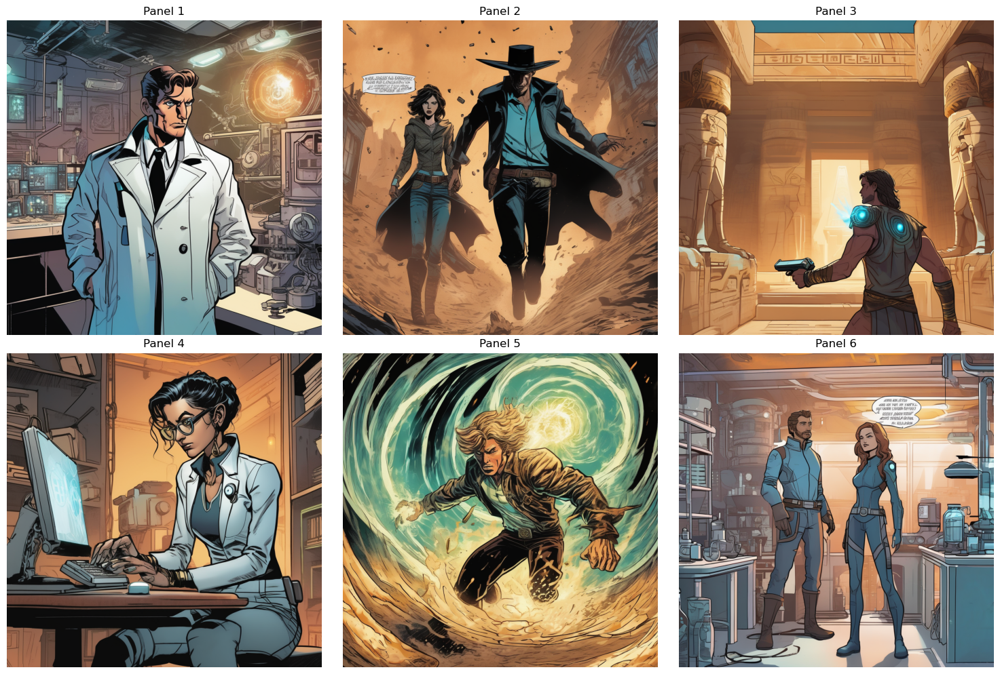

In [7]:
show_images(r"G:\DEBI\Assinments\comic book\science_fiction\fanta" )

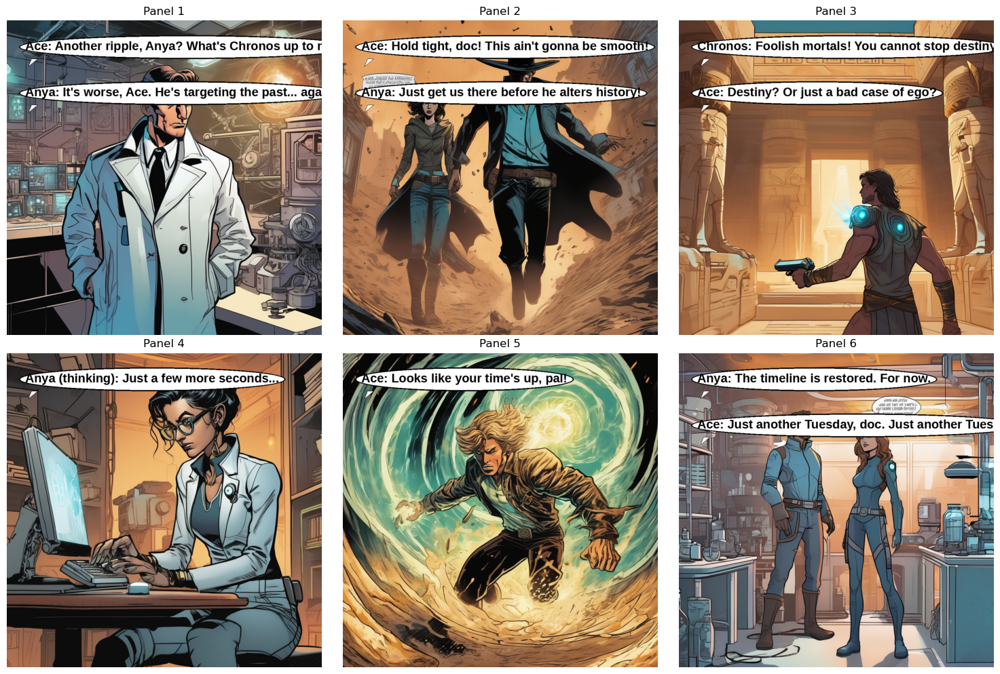

In [6]:
show_images(r"G:\DEBI\Assinments\comic book\science_fiction\fanta_rect" )

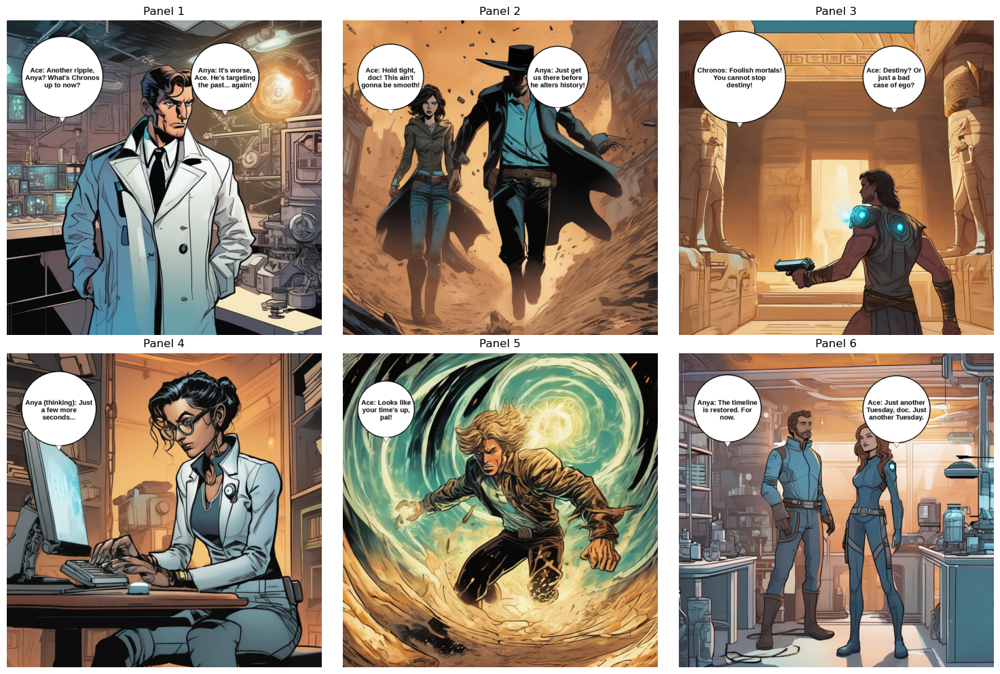

In [8]:
show_images(r"G:\DEBI\Assinments\comic book\science_fiction\fanta_final" )

In [ ]:
COMIC_DATA = {
    "scenes": [
        {
            "prompt": "Inside a high-tech urban lab, Ethan, a cybersecurity expert, is focused on his terminal. A sudden 'SYSTEM BREACH' alert flashes on the screen. The city skyline reflects in the window.",
            "narrative": "Ethan knew the breach was coming. The question was: who made it?",
            "dialogue": {"Ethan": "Backdoor accessed. Damn it.", "Tech Assistant": "Ethan, they're in the core."}
        },
        {
            "prompt": "Ethan and Rachael stealthily navigate through a high-security data center, dodging laser sensors as alarms begin to sound.",
            "narrative": "The team was close to the heart of the breach, but the clock was ticking.",
            "dialogue": {"Rachael": "We're not alone. Can you feel it?", "Ethan": "Stay focused."}
        },
        {
            "prompt": "In a sleek control room, Ethan faces off against Nadia, the rogue hacker, who's controlling the system remotely.",
            "narrative": "The final battle. A race against time and technology.",
            "dialogue": {"Nadia": "You can't stop me. The system is mine.", "Ethan": "We'll see about that."}
        },
        {
            "prompt": "Ethan and Rachael dash down a corridor, dodging guards and hacking doors. A drone zooms by overhead, scanning for them.",
            "narrative": "The closer they got, the more dangerous it became.",
            "dialogue": {"Rachael": "We’re almost there!", "Ethan": "No turning back now."}
        },
        {
            "prompt": "Inside the core vault, Ethan faces Nadia one final time. A digital lock stands between them. Explosions flash in the background.",
            "narrative": "The final decision will determine the fate of the city’s future.",
            "dialogue": {"Ethan": "It’s over.", "Nadia": "Not yet. This is just the beginning."}
        },
        {
            "prompt": "Ethan and Rachael sit in a dim diner, the city skyline in the background. The digital blackout lingers outside.",
            "narrative": "Victory was won, but the war was far from over.",
            "dialogue": {"Ethan": "What now?", "Rachael": "Now we wait... but we’ll be ready."}
        }
    ]
}

# Example of accessing data in the structure:
for scene in COMIC_DATA["scenes"]:
    print(f"Scene Prompt: {scene['prompt']}")
    print(f"Narrative: {scene['narrative']}")
    for character, dialogue in scene["dialogue"].items():
        print(f"{character}: {dialogue}")
    print("\n---\n")


Scene Prompt: Inside a high-tech urban lab, Ethan, a cybersecurity expert, is focused on his terminal. A sudden 'SYSTEM BREACH' alert flashes on the screen. The city skyline reflects in the window.
Narrative: Ethan knew the breach was coming. The question was: who made it?
Ethan: Backdoor accessed. Damn it.
Tech Assistant: Ethan, they're in the core.

---

Scene Prompt: Ethan and Rachael stealthily navigate through a high-security data center, dodging laser sensors as alarms begin to sound.
Narrative: The team was close to the heart of the breach, but the clock was ticking.
Rachael: We're not alone. Can you feel it?
Ethan: Stay focused.

---

Scene Prompt: In a sleek control room, Ethan faces off against Nadia, the rogue hacker, who's controlling the system remotely.
Narrative: The final battle. A race against time and technology.
Nadia: You can't stop me. The system is mine.
Ethan: We'll see about that.

---

Scene Prompt: Ethan and Rachael dash down a corridor, dodging guards and hac

In [ ]:
import torch
import os
from diffusers import DiffusionPipeline
from PIL import Image


# 1. Load the AI Model with memory optimizations
print("Loading AI Model with memory optimizations...")
pipe = DiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16,
    use_safetensors=True,
    variant="fp16"
)

# Optimization: Move model parts to CPU when not in use
pipe.enable_model_cpu_offload()
# Optimization: Reduce memory usage during image decoding
pipe.enable_vae_slicing()

def generate_real_images(model_name, comic_panels):
    """Generates actual images using the AI pipeline."""
    print(f"\n Starting REAL generation for: {model_name}")

    # Create folder
    output_dir = f"cyper/{model_name.lower().replace('-', '_')}"
    os.makedirs(output_dir, exist_ok=True)

    # Add style modifiers based on your model selection
    style_suffix = {
        "Comic-Diffusion": ", western comic book style, high ink detail, marvel dc style",
        "Animagine-XL": ", high quality anime style, manga, vibrant colors",
        "SDXL-Base": ", cinematic comic book art, highly detailed"
    }

    for i, panel_data in enumerate(comic_panels):
        image_path = os.path.join(output_dir, f"panel_{i+1}.png")
        full_prompt = panel_data["prompt"] + style_suffix.get(model_name, "")

        print(f"  > Generating Panel {i+1}...")

        # Generate image
        image = pipe(
            prompt=full_prompt,
            num_inference_steps=50,
            guidance_scale=10
        ).images[0]

        image.save(image_path)
        print(f"  [SAVED] {image_path}")

# --- Run the full process ---
from overlay_text_circ_bubbles import process_comic_panels
# import importlib
# import overlay_text_circ_bubbles
# importlib.reload(overlay_text_circ_bubbles)
# Clear existing CUDA cache before starting
torch.cuda.empty_cache()

for model_name, panels_data in COMIC_DATA.items():
    print(f" Creating high-res page for {model_name}...")
    generate_real_images(model_name, panels_data)
    process_comic_panels(model_name, panels_data)

print("\n ALL IMAGES GENERATED WITH MEMORY OPTIMIZATIONS!")

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


Loading AI Model with memory optimizations...


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/517 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/diffusers/pipelines/pipeline_utils.py:2186: FutureWarning: `enable_vae_slicing` is deprecated and will be removed in version 0.40.0. Calling `enable_vae_slicing()` on a `StableDiffusionXLPipeline` is deprecated and this method will be removed in a future version. Please use `pipe.vae.enable_slicing()`.
  deprecate(



 Starting REAL generation for: scenes
  > Generating Panel 1...


  0%|          | 0/50 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/diffusers/pipelines/stable_diffusion_xl/pipeline_stable_diffusion_xl.py:748: FutureWarning: `upcast_vae` is deprecated and will be removed in version 1.0.0. `upcast_vae` is deprecated. Please use `pipe.vae.to(torch.float32)`. For more details, please refer to: https://github.com/huggingface/diffusers/pull/12619#issue-3606633695.
  deprecate(


  [SAVED] cyper/scenes/panel_1.png
  > Generating Panel 2...


  0%|          | 0/50 [00:00<?, ?it/s]

  [SAVED] cyper/scenes/panel_2.png
  > Generating Panel 3...


  0%|          | 0/50 [00:00<?, ?it/s]

  [SAVED] cyper/scenes/panel_3.png
  > Generating Panel 4...


  0%|          | 0/50 [00:00<?, ?it/s]

  [SAVED] cyper/scenes/panel_4.png
  > Generating Panel 5...


  0%|          | 0/50 [00:00<?, ?it/s]

  [SAVED] cyper/scenes/panel_5.png
  > Generating Panel 6...


  0%|          | 0/50 [00:00<?, ?it/s]

  [SAVED] cyper/scenes/panel_6.png

 ALL IMAGES GENERATED WITH MEMORY OPTIMIZATIONS!


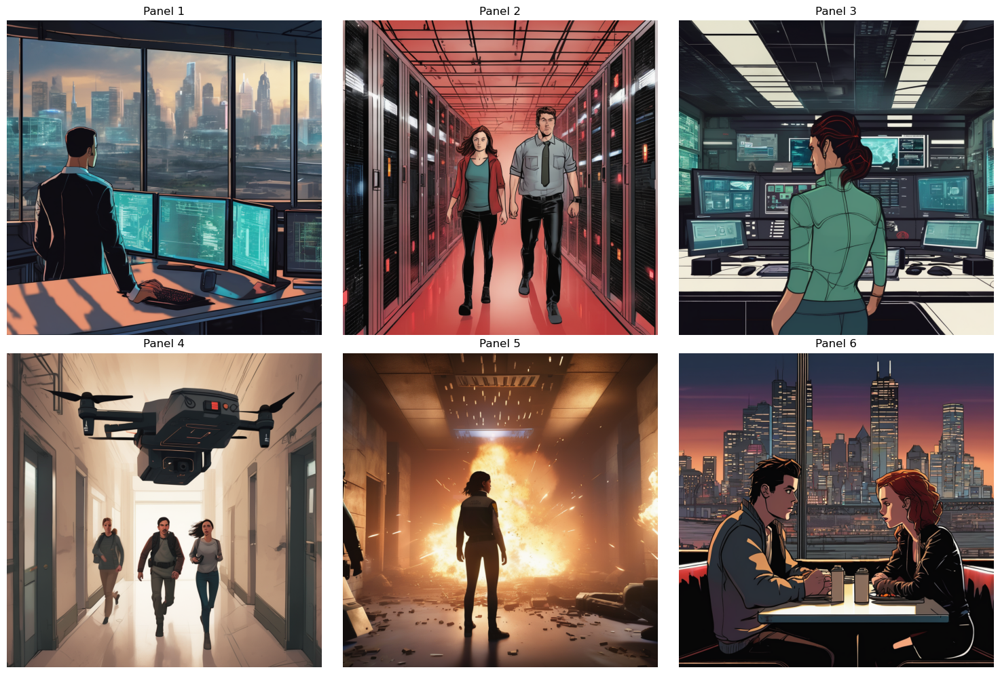

In [9]:
show_images(r"G:\DEBI\Assinments\comic book\cyper\scenes" )

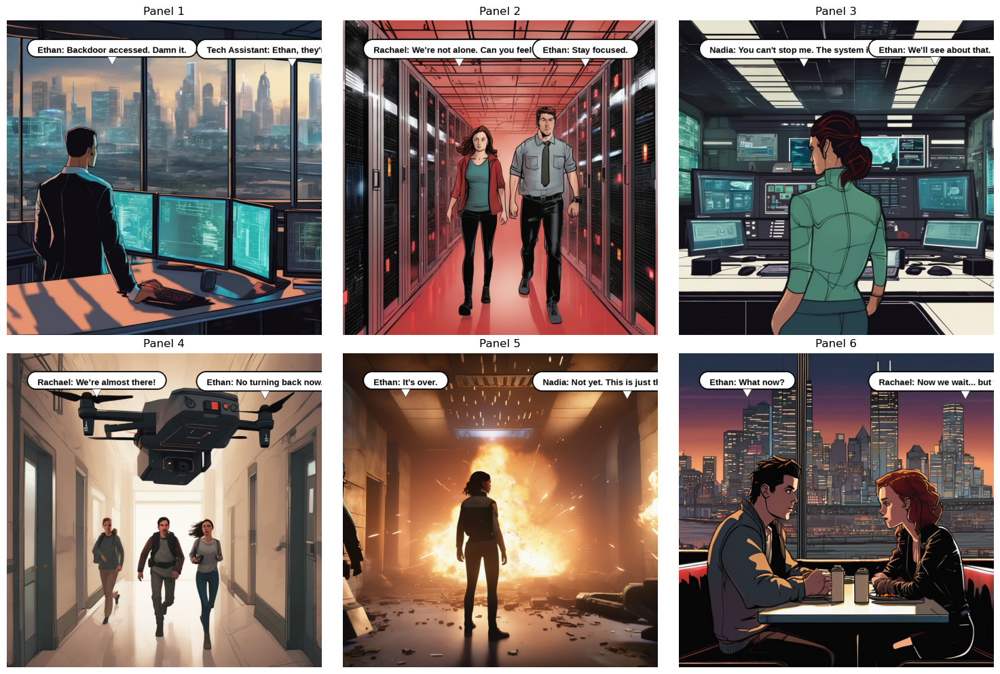

In [10]:
show_images(r"G:\DEBI\Assinments\comic book\cyper\scenes_rect" )

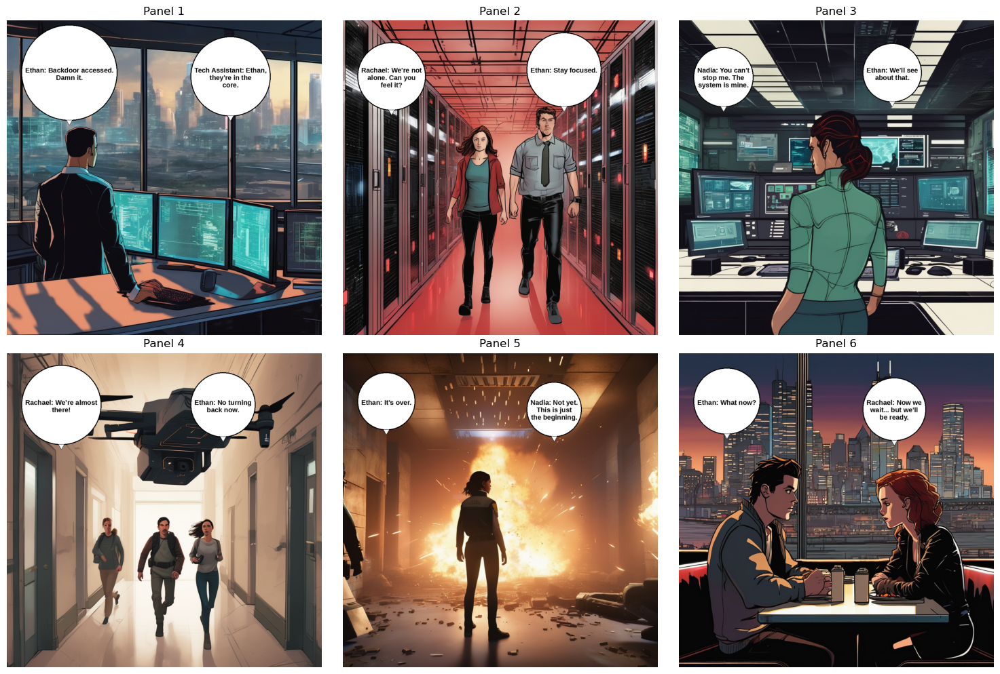

In [11]:
show_images("G:\DEBI\Assinments\comic book\cyper\scenes_final" )

In [ ]:
from PIL import Image
import os

def create_comic_page(image_folder, output_name="comic_page.jpg"):
    
    images = [os.path.join(image_folder, f) for f in sorted(os.listdir(image_folder)) if f.endswith(('.png', '.jpg', '.jpeg'))][:6]
    
    if len(images) < 6:
        print("Error: The folder contains less than 6 images!")
        return

    
    loaded_images = [Image.open(img).resize((800, 800)) for img in images]

    
    page_width = 800 * 3
    page_height = 800 * 2
    new_page = Image.new('RGB', (page_width, page_height), 'white')

    
    for index, img in enumerate(loaded_images):
        x = (index % 3) * 800  
        y = (index // 3) * 800 
        new_page.paste(img, (x, y))

    
    new_page.save(output_name, quality=95)
    print(f"Done: {output_name}")




Done: comic_page.jpg


In [ ]:
# create_comic_page(r"G:\DEBI\Assinments\comic book\cyper\scenes_final", output_name="cyper_comic_page.jpg")


Done: cyper_comic_page.jpg


In [14]:
create_comic_page(r"G:\DEBI\Assinments\comic book\science_fiction\fanta_final", output_name="fanta_comic_page.jpg")

Done: fanta_comic_page.jpg


In [ ]:
# !pip install git+https://github.com/openai/CLIP.git

In [ ]:
import torch
import clip
from PIL import Image
import os

device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

def evaluate_diffusion_output(image_path, prompt):
    """
    Eval Diffusion
    """
    image = preprocess(Image.open(image_path)).unsqueeze(0).to(device)
    text = clip.tokenize([prompt]).to(device)

    with torch.no_grad():
        image_features = model.encode_image(image)
        text_features = model.encode_text(text)

        image_features /= image_features.norm(dim=-1, keepdim=True)
        text_features /= text_features.norm(dim=-1, keepdim=True)
        similarity = (image_features @ text_features.T).item()


    prompt_adherence = round(similarity * 100, 2)


    aesthetic_proxy = round(torch.std(image_features).item() * 100, 2)

    return {
        "Prompt Adherence (CLIP Score)": prompt_adherence,
        "Aesthetic Quality": aesthetic_proxy,
        "Status": "High Quality" if prompt_adherence > 25 else "Needs Refinement"
    }

def evaluate_comic_book(image_folder, prompts):
    """
    تقييم الجودة التامة للكتاب الهزلي من خلال الصور والـ prompts
    """
    results = {}

    for idx, image_file in enumerate(sorted(os.listdir(image_folder))):
        if image_file.endswith(('.png', '.jpg', '.jpeg')):
            image_path = os.path.join(image_folder, image_file)
            prompt = prompts[idx]
            print(f"Evaluating panel {image_file} with prompt: {prompt}")
            panel_results = evaluate_diffusion_output(image_path, prompt)
            results[image_file] = panel_results

    return results

image_folder = "/content/drive/MyDrive/cyper/scenes_final"
prompts = [
    "Inside a high-tech urban lab, Ethan, a cybersecurity expert, is focused on his terminal. A sudden 'SYSTEM BREACH' alert flashes on the screen. The city skyline reflects in the window.",
    "Ethan and Rachael stealthily navigate through a high-security data center, dodging laser sensors as alarms begin to sound."    "Grand Server Room, Anime aesthetic. Kaito, katana ablaze with blue flame, confronts the towering Lord Kage on a digital throne. Lord Kage has a massive obsidian robotic arm.",
    "In a sleek control room, Ethan faces off against Nadia, the rogue hacker, who's controlling the system remotely.",
    "Ethan and Rachael dash down a corridor, dodging guards and hacking doors. A drone zooms by overhead, scanning for them.",
    "Inside the core vault, Ethan faces Nadia one final time. A digital lock stands between them. Explosions flash in the background.",
    "Ethan and Rachael sit in a dim diner, the city skyline in the background. The digital blackout lingers outside.",

]


if os.path.exists(image_folder):
    results = evaluate_comic_book(image_folder, prompts)
    print(f"------")
    for panel, result in results.items():
        print(f"Panel: {panel}")
        for metric, value in result.items():
            print(f"{metric}: {value}")
        print("\n---\n")
else:
    print("is no here")


100%|███████████████████████████████████████| 338M/338M [00:07<00:00, 46.5MiB/s]


Evaluating panel res_panel_1.png with prompt: Inside a high-tech urban lab, Ethan, a cybersecurity expert, is focused on his terminal. A sudden 'SYSTEM BREACH' alert flashes on the screen. The city skyline reflects in the window.
Evaluating panel res_panel_2.png with prompt: Ethan and Rachael stealthily navigate through a high-security data center, dodging laser sensors as alarms begin to sound.Grand Server Room, Anime aesthetic. Kaito, katana ablaze with blue flame, confronts the towering Lord Kage on a digital throne. Lord Kage has a massive obsidian robotic arm.
Evaluating panel res_panel_3.png with prompt: In a sleek control room, Ethan faces off against Nadia, the rogue hacker, who's controlling the system remotely.
Evaluating panel res_panel_4.png with prompt: Ethan and Rachael dash down a corridor, dodging guards and hacking doors. A drone zooms by overhead, scanning for them.
Evaluating panel res_panel_5.png with prompt: Inside the core vault, Ethan faces Nadia one final time. 